In [1]:
import numpy as np
np.set_printoptions(threshold=np.inf)
import pandas as pd
#matplotlib
import matplotlib.pyplot as plt # this is used for the plot the graph 
import seaborn as sns # used for plot interactive graph. I like it most for plot
#plotly
import plotly.plotly as py
from plotly.graph_objs import *
import plotly
import plotly.tools as tls
import plotly.graph_objs as go
import plotly.figure_factory as ff
from  plotly  import __version__
#plotly offline
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
print(__version__) # requires version >= 1.9.0
init_notebook_mode(connected=True)

3.1.0


In [2]:
df = pd.read_csv('~/Desktop/python/gun_violence_data.csv')
pd.set_option('display.max_columns', 31)

In [3]:
df.head(200)

,incident_id,date,state,city_or_county,address,n_killed,n_injured,incident_url,source_url,incident_url_fields_missing,congressional_district,gun_stolen,gun_type,incident_characteristics,latitude,location_description,longitude,n_guns_involved,notes,participant_age,participant_age_group,participant_gender,participant_name,participant_relationship,participant_status,participant_type,sources,state_house_district,state_senate_district
0,461105,2013-01-01,Pennsylvania,Mckeesport,1506 Versailles Avenue and Coursin Street,0,4,http://www.gunviolencearchive.org/incident/461105,http://www.post-gazette.com/local/south/2013/0...,False,14.0,NaN,NaN,Shot - Wounded/Injured||Mass Shooting (4+ vict...,40.3467,NaN,-79.8559,NaN,Julian Sims under investigation: Four Shot and...,0::20,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||3::Male||4::Female,0::Julian Sims,NaN,0::Arrested||1::Injured||2::Injured||3::Injure...,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://pittsburgh.cbslocal.com/2013/01/01/4-pe...,NaN,NaN
1,460726,2013-01-01,California,Hawthorne,13500 block of Cerise Avenue,1,3,http://www.gunviolencearchive.org/incident/460726,http://www.dailybulletin.com/article/zz/201301...,False,43.0,NaN,NaN,"Shot - Wounded/Injured||Shot - Dead (murder, a...",33.9090,NaN,-118.3330,NaN,Four Shot; One Killed; Unidentified shooter in...,0::20,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male,0::Bernard Gillis,NaN,0::Killed||1::Injured||2::Injured||3::Injured,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://losangeles.cbslocal.com/2013/01/01/man-...,62.0,35.0
2,478855,2013-01-01,Ohio,Lorain,1776 East 28th Street,1,3,http://www.gunviolencearchive.org/incident/478855,http://chronicle.northcoastnow.com/2013/02/14/...,False,9.0,0::Unknown||1::Unknown,0::Unknown||1::Unknown,"Shot - Wounded/Injured||Shot - Dead (murder, a...",41.4455,Cotton Club,-82.1377,2.0,NaN,0::25||1::31||2::33||3::34||4::33,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||2::Male||3::Male||4::Male,0::Damien Bell||1::Desmen Noble||2::Herman Sea...,NaN,"0::Injured, Unharmed, Arrested||1::Unharmed, A...",0::Subject-Suspect||1::Subject-Suspect||2::Vic...,http://www.morningjournal.com/general-news/201...,56.0,13.0
3,478925,2013-01-05,Colorado,Aurora,16000 block of East Ithaca Place,4,0,http://www.gunviolencearchive.org/incident/478925,http://www.dailydemocrat.com/20130106/aurora-s...,False,6.0,NaN,NaN,"Shot - Dead (murder, accidental, suicide)||Off...",39.6518,NaN,-104.8020,NaN,NaN,0::29||1::33||2::56||3::33,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Female||1::Male||2::Male||3::Male,0::Stacie Philbrook||1::Christopher Ratliffe||...,NaN,0::Killed||1::Killed||2::Killed||3::Killed,0::Victim||1::Victim||2::Victim||3::Subject-Su...,http://denver.cbslocal.com/2013/01/06/officer-...,40.0,28.0
4,478959,2013-01-07,North Carolina,Greensboro,307 Mourning Dove Terrace,2,2,http://www.gunviolencearchive.org/incident/478959,http://www.journalnow.com/news/local/article_d...,False,6.0,0::Unknown||1::Unknown,0::Handgun||1::Handgun,"Shot - Wounded/Injured||Shot - Dead (murder, a...",36.1140,NaN,-79.9569,2.0,Two firearms recovered. (Attempted) murder sui...,0::18||1::46||2::14||3::47,0::Adult 18+||1::Adult 18+||2::Teen 12-17||3::...,0::Female||1::Male||2::Male||3::Female,0::Danielle Imani Jameison||1::Maurice Eugene ...,3::Family,0::Injured||1::Injured||2::Killed||3::Killed,0::Victim||1::Victim||2::Victim||3::Subject-Su...,http://myfox8.com/2013/01/08/update-mother-sho...,62.0,27.0
5,478948,2013-01-07,Oklahoma,Tulsa,6000 block of South Owasso,4,0,http://www.gunviolencearchive.org/incident/478948,http://usnews.nbcnews.com/_news/2013/01/07/163...,False,1.0,NaN,NaN,"Shot - Dead (murder, accidental, suicide)||Hom...",36.2405,Fairmont Terrace,-95.9768,NaN,NaN,0::23||1::23||2::33||3::55,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Female||1::Female||2::Female||3::Female||4:...,0::Rebeika Powell||1::Kayetie Melchor||2::Mist...,NaN,0::Killed

### Initial Data Analysis

In [4]:
df.shape

(239677, 29)

In [5]:
df.describe()

,incident_id,n_killed,n_injured,congressional_district,latitude,longitude,n_guns_involved,state_house_district,state_senate_district
count,2.396770e+05,239677.000000,239677.000000,227733.000000,231754.000000,231754.000000,140226.000000,200905.000000,207342.00000
mean,5.593343e+05,0.252290,0.494007,8.001265,37.546598,-89.338348,1.372442,55.447132,20.47711
std,2.931287e+05,0.521779,0.729952,8.480835,5.130763,14.359546,4.678202,42.048117,14.20456
min,9.211400e+04,0.000000,0.000000,0.000000,19.111400,-171.429000,1.000000,1.000000,1.00000
25%,3.085450e+05,0.000000,0.000000,2.000000,33.903400,-94.158725,1.000000,21.000000,9.00000
50%,5.435870e+05,0.000000,0.000000,5.000000,38.570600,-86.249600,1.000000,47.000000,19.00000
75%,8.172280e+05,0.000000,1.000000,10.000000,41.437375,-80.048625,1.000000,84.000000,30.00000
max,1.083472e+06,50.000000,53.000000,53.000000,71.336800,97.433100,400.000000,901.000000,94.00000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 239677 entries, 0 to 239676
Data columns (total 29 columns):
incident_id                    239677 non-null int64
date                           239677 non-null object
state                          239677 non-null object
city_or_county                 239677 non-null object
address                        223180 non-null object
n_killed                       239677 non-null int64
n_injured                      239677 non-null int64
incident_url                   239677 non-null object
source_url                     239209 non-null object
incident_url_fields_missing    239677 non-null bool
congressional_district         227733 non-null float64
gun_stolen                     140179 non-null object
gun_type                       140226 non-null object
incident_characteristics       239351 non-null object
latitude                       231754 non-null float64
location_description           42089 non-null object
longitude                    

In [7]:
missing_data_sum= df.isna().sum()
missing_data_count= df.isna().count()
percentage_missing_data=(missing_data_sum/missing_data_count) * 100
print(percentage_missing_data)

incident_id                     0.000000
date                            0.000000
state                           0.000000
city_or_county                  0.000000
address                         6.883013
n_killed                        0.000000
n_injured                       0.000000
incident_url                    0.000000
source_url                      0.195263
incident_url_fields_missing     0.000000
congressional_district          4.983373
gun_stolen                     41.513370
gun_type                       41.493760
incident_characteristics        0.136016
latitude                        3.305699
location_description           82.439283
longitude                       3.305699
n_guns_involved                41.493760
notes                          33.802576
participant_age                38.509327
participant_age_group          17.573234
participant_gender             15.171251
participant_name               51.007397
participant_relationship       93.418643
participant_stat

In [8]:
X = df

In [9]:
X.drop(['participant_status', 'participant_name', 'participant_status', 'location_description', 'incident_url_fields_missing'], axis=1, inplace=True)

In [10]:
X['mass_shooting'] = pd.Series(np.where(X.n_killed.values >= 4, 1, 0), X.index)

In [11]:
X['total_involved'] = X.n_killed + X.n_injured

In [12]:
X.n_killed.sum()

60468

In [13]:
X['datetime'] = pd.to_datetime(X['date'])

In [14]:
X.groupby(X['datetime'].dt.strftime('%B'))['total_involved'].sum().sort_values()

datetime
April        13290
February     13365
December     13863
November     13935
September    14545
October      14547
June         14683
May          15074
August       15936
March        16116
July         16535
January      16981
Name: total_involved, dtype: int64

In [15]:
trace = go.Scatter(
    x=X.datetime,
    y=X['total_involved'],
    name = "People Killed or Injured",
    line = dict(color = '#275CB9'),
    opacity = 0.8)

data = [trace]

layout = dict(
    title='Time Series of Gun Violence with Rangeslider',
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label='1m',
                     step='month',
                     stepmode='backward'),
                dict(count=6,
                     label='6m',
                     step='month',
                     stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(
            visible = True
        ),
        type='date'
    )
)

fig = dict(data=data, layout=layout)
iplot(fig, filename = "Time Series with Rangeslider")

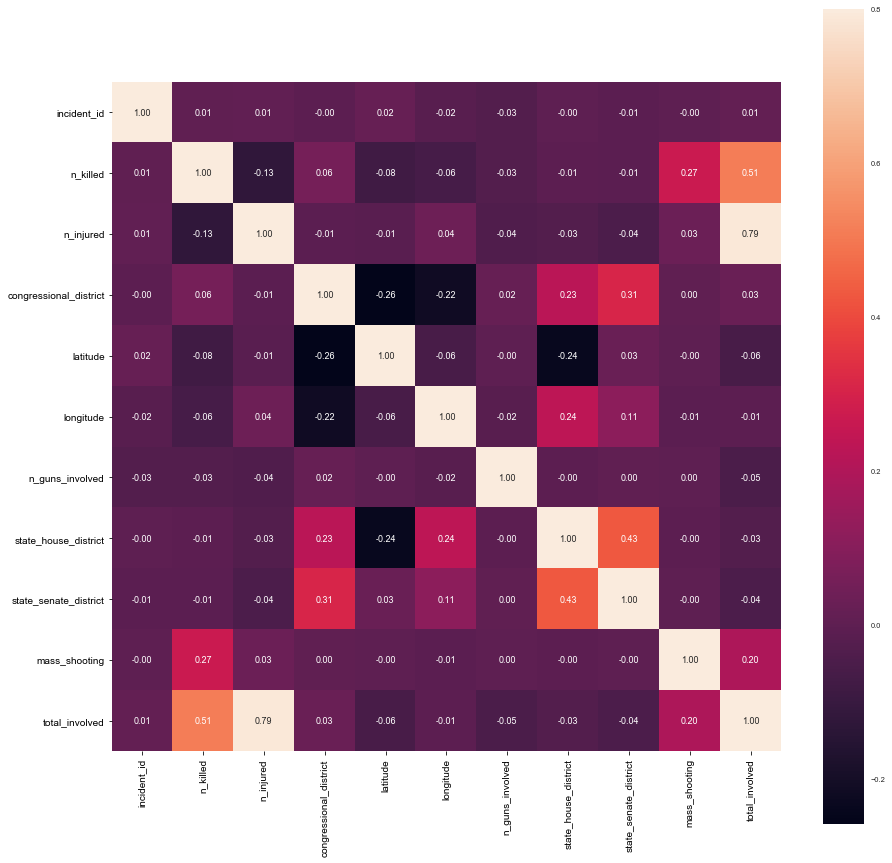

In [16]:
corrmat = X.corr()
f, ax = plt.subplots(figsize=(15, 15))
sns.set(font_scale=0.75)
sns.heatmap(corrmat,annot=True, square=True, fmt='.2f', vmax=.8);

In [17]:
X.groupby('mass_shooting').count()

,incident_id,date,state,city_or_county,address,n_killed,n_injured,incident_url,source_url,congressional_district,gun_stolen,gun_type,incident_characteristics,latitude,longitude,n_guns_involved,notes,participant_age,participant_age_group,participant_gender,participant_relationship,participant_type,sources,state_house_district,state_senate_district,total_involved,datetime
mass_shooting,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,239470,239470,239470,239470,222974,239470,239470,239470,239003,227534,140027,140074,239144,231552,231552,140074,158495,147174,197351,203108,15683,214607,238861,200723,207154,239470,239470
1,207,207,207,207,206,207,207,207,206,199,152,152,207,202,202,152,165,205,207,207,91,207,207,182,188,207,207


### Data Cleaning

In [18]:
X.head(10)

,incident_id,date,state,city_or_county,address,n_killed,n_injured,incident_url,source_url,congressional_district,gun_stolen,gun_type,incident_characteristics,latitude,longitude,n_guns_involved,notes,participant_age,participant_age_group,participant_gender,participant_relationship,participant_type,sources,state_house_district,state_senate_district,mass_shooting,total_involved,datetime
0,461105,2013-01-01,Pennsylvania,Mckeesport,1506 Versailles Avenue and Coursin Street,0,4,http://www.gunviolencearchive.org/incident/461105,http://www.post-gazette.com/local/south/2013/0...,14.0,NaN,NaN,Shot - Wounded/Injured||Mass Shooting (4+ vict...,40.3467,-79.8559,NaN,Julian Sims under investigation: Four Shot and...,0::20,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||3::Male||4::Female,NaN,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://pittsburgh.cbslocal.com/2013/01/01/4-pe...,NaN,NaN,0,4,2013-01-01
1,460726,2013-01-01,California,Hawthorne,13500 block of Cerise Avenue,1,3,http://www.gunviolencearchive.org/incident/460726,http://www.dailybulletin.com/article/zz/201301...,43.0,NaN,NaN,"Shot - Wounded/Injured||Shot - Dead (murder, a...",33.9090,-118.3330,NaN,Four Shot; One Killed; Unidentified shooter in...,0::20,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male,NaN,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://losangeles.cbslocal.com/2013/01/01/man-...,62.0,35.0,0,4,2013-01-01
2,478855,2013-01-01,Ohio,Lorain,1776 East 28th Street,1,3,http://www.gunviolencearchive.org/incident/478855,http://chronicle.northcoastnow.com/2013/02/14/...,9.0,0::Unknown||1::Unknown,0::Unknown||1::Unknown,"Shot - Wounded/Injured||Shot - Dead (murder, a...",41.4455,-82.1377,2.0,NaN,0::25||1::31||2::33||3::34||4::33,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||2::Male||3::Male||4::Male,NaN,0::Subject-Suspect||1::Subject-Suspect||2::Vic...,http://www.morningjournal.com/general-news/201...,56.0,13.0,0,4,2013-01-01
3,478925,2013-01-05,Colorado,Aurora,16000 block of East Ithaca Place,4,0,http://www.gunviolencearchive.org/incident/478925,http://www.dailydemocrat.com/20130106/aurora-s...,6.0,NaN,NaN,"Shot - Dead (murder, accidental, suicide)||Off...",39.6518,-104.8020,NaN,NaN,0::29||1::33||2::56||3::33,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Female||1::Male||2::Male||3::Male,NaN,0::Victim||1::Victim||2::Victim||3::Subject-Su...,http://denver.cbslocal.com/2013/01/06/officer-...,40.0,28.0,1,4,2013-01-05
4,478959,2013-01-07,North Carolina,Greensboro,307 Mourning Dove Terrace,2,2,http://www.gunviolencearchive.org/incident/478959,http://www.journalnow.com/news/local/article_d...,6.0,0::Unknown||1::Unknown,0::Handgun||1::Handgun,"Shot - Wounded/Injured||Shot - Dead (murder, a...",36.1140,-79.9569,2.0,Two firearms recovered. (Attempted) murder sui...,0::18||1::46||2::14||3::47,0::Adult 18+||1::Adult 18+||2::Teen 12-17||3::...,0::Female||1::Male||2::Male||3::Female,3::Family,0::Victim||1::Victim||2::Victim||3::Subject-Su...,http://myfox8.com/2013/01/08/update-mother-sho...,62.0,27.0,0,4,2013-01-07
5,478948,2013-01-07,Oklahoma,Tulsa,6000 block of South Owasso,4,0,http://www.gunviolencearchive.org/incident/478948,http://usnews.nbcnews.com/_news/2013/01/07/163...,1.0,NaN,NaN,"Shot - Dead (murder, accidental, suicide)||Hom...",36.2405,-95.9768,NaN,NaN,0::23||1::23||2::33||3::55,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Female||1::Female||2::Female||3::Female||4:...,NaN,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://www.kjrh.com/news/local-news/4-found-sh...,72.0,11.0,1,4,2013-01-07
6,479363,2013-01-19,New Mexico,Albuquerque,2806 Long Lane,5,0,http://www.gunviolencearchive.org/incident/479363,http://hinterlandgazette.com/2013/01/pastor-gr...,1.0,0::Unknown||1::Unknown,0::22 LR||1::223 Rem [AR-15],"Shot - Dead (murder, accidental, suicide)||Mas...",34.9791,-106.7160,2.0,NaN,0::51||1::40||2::9||3::5||4::2||5::15,0::Adult 18+||1::Adult 18+||2::Child 0-11||3::...,0::Male||1::Female||2:

In [19]:
X.n_killed.max()

50

In [20]:
most = X['n_killed'].max()
X[X['n_killed'] == most]

,incident_id,date,state,city_or_county,address,n_killed,n_injured,incident_url,source_url,congressional_district,gun_stolen,gun_type,incident_characteristics,latitude,longitude,n_guns_involved,notes,participant_age,participant_age_group,participant_gender,participant_relationship,participant_type,sources,state_house_district,state_senate_district,mass_shooting,total_involved,datetime
130448,577157,2016-06-12,Florida,Orlando,1912 S Orange Avenue,50,53,http://www.gunviolencearchive.org/incident/577157,https://www.reuters.com/article/us-orlando-sho...,5.0,0::Not-stolen||1::Not-stolen,0::223 Rem [AR-15]||1::9mm,"Shot - Wounded/Injured||Shot - Dead (murder, a...",28.5195,-81.3767,2.0,Names are coming in sporadically and every eff...,0::34||1::23||2::20||3::22||4::36||5::22||6::2...,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||2::Male||3::Male||4::Male||5...,NaN,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://www.cityoforlando.net/police/mass-shoot...,47.0,12.0,1,103,2016-06-12


In [21]:
X = X.drop(X.index[130448])

In [22]:
X.n_killed.max()

27

In [23]:
X['gun_type'] = X['gun_type'].replace({'0::': '', '1::': '', '2::': '','3::': '','4::': '','5::': '','6::': '','7::': '','8::': '','9::': '','10::': '','11::': '','12::': '','13::': '','14::': '','15::': '','16::': '','17::': '','18::': '','19::': '','20::': '','21::': '','22::': '','23::': '','24::': '','25::': '','26::': '','27::': '',}, regex=True)

In [24]:
X['gun_type'] = X['gun_type'].replace({'0:': '', '1:': '', '2:': '','3:': '','4:': '','5:': '','6:': '','7:': '','8:': '','9:': '','10:': '','11:': '','12:': '','13:': '','14:': '','15:': '','16:': '','17:': '','18:': '','19:': '','20:': '','21:': '','22:': '','23:': '','24:': '','25:': '','26:': '','27:': '','28:': '','29:': ''}, regex=True)

In [25]:
X.dtypes

incident_id                          int64
date                                object
state                               object
city_or_county                      object
address                             object
n_killed                             int64
n_injured                            int64
incident_url                        object
source_url                          object
congressional_district             float64
gun_stolen                          object
gun_type                            object
incident_characteristics            object
latitude                           float64
longitude                          float64
n_guns_involved                    float64
notes                               object
participant_age                     object
participant_age_group               object
participant_gender                  object
participant_relationship            object
participant_type                    object
sources                             object
state_house

In [26]:
def replace_pipe(x):
    try: 
        return x.replace('|', ', ')
    except AttributeError:
        return np.NaN

X.gun_type = X.gun_type.map(replace_pipe)

In [27]:
def replace_double(x):
    try: 
        return x.replace(',,', ', ')
    except AttributeError:
        return np.NaN

X.gun_type = X.gun_type.map(replace_double)

In [28]:
def replace_space(x):
    try: 
        return x.replace(',', ', ')
    except AttributeError:
        return np.NaN

X.gun_type = X.gun_type.map(replace_space)

In [29]:
X.head(5)

,incident_id,date,state,city_or_county,address,n_killed,n_injured,incident_url,source_url,congressional_district,gun_stolen,gun_type,incident_characteristics,latitude,longitude,n_guns_involved,notes,participant_age,participant_age_group,participant_gender,participant_relationship,participant_type,sources,state_house_district,state_senate_district,mass_shooting,total_involved,datetime
0,461105,2013-01-01,Pennsylvania,Mckeesport,1506 Versailles Avenue and Coursin Street,0,4,http://www.gunviolencearchive.org/incident/461105,http://www.post-gazette.com/local/south/2013/0...,14.0,NaN,NaN,Shot - Wounded/Injured||Mass Shooting (4+ vict...,40.3467,-79.8559,NaN,Julian Sims under investigation: Four Shot and...,0::20,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||3::Male||4::Female,NaN,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://pittsburgh.cbslocal.com/2013/01/01/4-pe...,NaN,NaN,0,4,2013-01-01
1,460726,2013-01-01,California,Hawthorne,13500 block of Cerise Avenue,1,3,http://www.gunviolencearchive.org/incident/460726,http://www.dailybulletin.com/article/zz/201301...,43.0,NaN,NaN,"Shot - Wounded/Injured||Shot - Dead (murder, a...",33.9090,-118.3330,NaN,Four Shot; One Killed; Unidentified shooter in...,0::20,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male,NaN,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://losangeles.cbslocal.com/2013/01/01/man-...,62.0,35.0,0,4,2013-01-01
2,478855,2013-01-01,Ohio,Lorain,1776 East 28th Street,1,3,http://www.gunviolencearchive.org/incident/478855,http://chronicle.northcoastnow.com/2013/02/14/...,9.0,0::Unknown||1::Unknown,"Unknown, , Unknown","Shot - Wounded/Injured||Shot - Dead (murder, a...",41.4455,-82.1377,2.0,NaN,0::25||1::31||2::33||3::34||4::33,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||2::Male||3::Male||4::Male,NaN,0::Subject-Suspect||1::Subject-Suspect||2::Vic...,http://www.morningjournal.com/general-news/201...,56.0,13.0,0,4,2013-01-01
3,478925,2013-01-05,Colorado,Aurora,16000 block of East Ithaca Place,4,0,http://www.gunviolencearchive.org/incident/478925,http://www.dailydemocrat.com/20130106/aurora-s...,6.0,NaN,NaN,"Shot - Dead (murder, accidental, suicide)||Off...",39.6518,-104.8020,NaN,NaN,0::29||1::33||2::56||3::33,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Female||1::Male||2::Male||3::Male,NaN,0::Victim||1::Victim||2::Victim||3::Subject-Su...,http://denver.cbslocal.com/2013/01/06/officer-...,40.0,28.0,1,4,2013-01-05
4,478959,2013-01-07,North Carolina,Greensboro,307 Mourning Dove Terrace,2,2,http://www.gunviolencearchive.org/incident/478959,http://www.journalnow.com/news/local/article_d...,6.0,0::Unknown||1::Unknown,"Handgun, , Handgun","Shot - Wounded/Injured||Shot - Dead (murder, a...",36.1140,-79.9569,2.0,Two firearms recovered. (Attempted) murder sui...,0::18||1::46||2::14||3::47,0::Adult 18+||1::Adult 18+||2::Teen 12-17||3::...,0::Female||1::Male||2::Male||3::Female,3::Family,0::Victim||1::Victim||2::Victim||3::Subject-Su...,http://myfox8.com/2013/01/08/update-mother-sho...,62.0,27.0,0,4,2013-01-07


In [30]:
len(X['gun_type'].unique().tolist())

2487

In [31]:
#X.loc[X['c1'] == 'Value', 'c2'] = 10

In [32]:
X['handgun'] = 0

In [33]:
X['rifle'] = 0

In [34]:
X['shotgun'] = 0

In [35]:
X['automatic'] = 0

In [36]:
h1 = X['gun_type'] == '9mm'
h2 = X['gun_type'] == '44 Mag'
h3 = X['gun_type'] == '380 Auto'
h4 = X['gun_type'] == '410 gauge'
h5 = X['gun_type'] == '25 Auto'
h6 = X['gun_type'] == '22 LR'
h7 = X['gun_type'] == '357 Mag'
h8 = X['gun_type'] == '45 Auto'
h9 = X['gun_type'] == '38 Spl'
h10 = X['gun_type'] == '32 Auto'
h11 = X['gun_type'] == '1Handgun'
h12 = X['gun_type'] == '2Handgun'
h13 = X['gun_type'] == 'Handgun'
h14 = X['gun_type'] == '29mm'
h15 = X['gun_type'] == '2380 Auto'
h16 = X['gun_type'] == '1380 Auto'
h17 = X['gun_type'] == '3380 Auto'
h18 = X['gun_type'] == '138 Spl'
h19 = X['gun_type'] == '238 Spl'
h20 = X['gun_type'] == '338 Spl'
h21 = X['gun_type'] == '19mm'
h22 = X['gun_type'] == '39mm'
h23 = X['gun_type'] == '144 Mag'
h24 = X['gun_type'] == '1410 gauge'
h25 = X['gun_type'] == '125 Auto'
h26 = X['gun_type'] == '225 Auto'
handgun_change = (h1 | h2 | h3 | h4 | h5 | h6 | h7 | h8 | h9| h10 | h11 | h12 | h13 | h14 | h15 | h16 | h17 | h18 | h19 | h20 | h21 | h22 | h23 | h24 | h25 | h26)
X['handgun'][handgun_change] = 1

In [37]:
s1 = X['gun_type'] == '12 gauge'
s2 = X['gun_type'] == 'Shotgun'
s3 = X['gun_type'] == '20 gauge'
s4 = X['gun_type'] == '16 gauge'
s5 = X['gun_type'] == '112 gauge'
s6 = X['gun_type'] == '120 gauge'
s7 = X['gun_type'] == '220 gauge'
s8 = X['gun_type'] == '28 gauge'
s9 = X['gun_type'] == '116 gauge'
s10 = X['gun_type'] == '212 gauge' 
s11 = X['gun_type'] == '312 gauge' 
s12 = X['gun_type'] == '1Shotgun'
s13 = X['gun_type'] == '2Shotgun'
s14 = X['gun_type'] == '3Shotgun'

shotgun_change = (s1 | s2 | s3 | s4 | s5 | s6 | s7 | s8 | s9 | s10 | s11 | s12 | s13 | s14)
X['shotgun'][shotgun_change] = 1

In [38]:
r1 = X['gun_type'] == '22 LR'
r2 = X['gun_type'] == '223 Rem'
r3 = X['gun_type'] == '223 Rem "[AR-15]"'
r4 = X['gun_type'] == '7.62 "[AK-47]"'
r5 = X['gun_type'] == '40 SW'
r6 = X['gun_type'] == 'Rifle'
r7 = X['gun_type'] == '30-30 Win'
r8 = X['gun_type'] == '2223 Rem "[AR-15]"'
r9 = X['gun_type'] == '1223 Rem "[AR-15]"'
r10 = X['gun_type'] == '308 Win'
r11 = X['gun_type'] == '240 SW'
r12 = X['gun_type'] == '122 LR'
r13 = X['gun_type'] == '222 LR'
r14 = X['gun_type'] == '322 LR'
r15 = X['gun_type'] == '3223 Rem "[AR-15]"'
r16 = X['gun_type'] == '17.62 "[AK-47]"'
r17 = X['gun_type'] == '140 SW'
r18 = X['gun_type'] == '240 SW'
r19 = X['gun_type'] == '340 SW'
r20 = X['gun_type'] == '130-30 Win'
r21 = X['gun_type'] == '1Rifle'
r22 = X['gun_type'] == '2Rifle'
r23 = X['gun_type'] == '3Rifle'
r24 = X['gun_type'] == '4Rifle'
r25 = X['gun_type'] == '5Rifle'

rifle_change = (r1 | r2 | r3 | r4 | r5 | r6 | r7 | r8 | r9 | r10 | r11 | r12 | r13 | r14 | r15 | r16 | r17 | r18 | r19 | r20 | r21 | r22 | r23 | r24 | r25)
X['rifle'][rifle_change] = 1

In [39]:
X['gun_type'].unique()

array([nan, 'Unknown, , Unknown', 'Handgun, , Handgun',
       '22 LR, , 223 Rem [AR-15]', 'Unknown', 'Shotgun', 'Handgun', '9mm',
       '45 Auto', '12 gauge', '7.62 [AK-47]',
       '9mm, , 9mm, , 40 SW, , 40 SW', '40 SW, , Shotgun',
       '7.62 [AK-47], , 40 SW, , 9mm', '9mm, , 45 Auto', '44 Mag',
       '223 Rem [AR-15], , 44 Mag', 'Other', '40 SW', '38 Spl',
       'Handgun, , Handgun, , Handgun', '22 LR', '380 Auto',
       '9mm, , 40 SW', '22 LR, , 410 gauge, , 32 Auto', '9mm, , Shotgun',
       '308 Win', 'Other, , Other', 'Rifle', '357 Mag', '22 LR, , Rifle',
       'Handgun, , Rifle', '16 gauge', '40 SW, , 357 Mag',
       '9mm, , Unknown', 'Unknown, , Unknown, , Unknown, , Unknown',
       '38 Spl, , 9mm', '30-30 Win',
       '25 Auto, , 38 Spl, , 32 Auto, , 22 LR',
       '9mm, , 45 Auto, , 12 gauge, , 22 LR', 'Shotgun, , 30-30 Win',
       'Shotgun, , Handgun', '410 gauge', 'Unknown, , Unknown, , Unknown',
       'Rifle, , Handgun, , 45 Auto, , 40 SW, , 38 Spl, , 9mm',
  

In [40]:
X.head(100)

,incident_id,date,state,city_or_county,address,n_killed,n_injured,incident_url,source_url,congressional_district,gun_stolen,gun_type,incident_characteristics,latitude,longitude,...,participant_age,participant_age_group,participant_gender,participant_relationship,participant_type,sources,state_house_district,state_senate_district,mass_shooting,total_involved,datetime,handgun,rifle,shotgun,automatic
0,461105,2013-01-01,Pennsylvania,Mckeesport,1506 Versailles Avenue and Coursin Street,0,4,http://www.gunviolencearchive.org/incident/461105,http://www.post-gazette.com/local/south/2013/0...,14.0,NaN,NaN,Shot - Wounded/Injured||Mass Shooting (4+ vict...,40.3467,-79.8559,...,0::20,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||3::Male||4::Female,NaN,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://pittsburgh.cbslocal.com/2013/01/01/4-pe...,NaN,NaN,0,4,2013-01-01,0,0,0,0
1,460726,2013-01-01,California,Hawthorne,13500 block of Cerise Avenue,1,3,http://www.gunviolencearchive.org/incident/460726,http://www.dailybulletin.com/article/zz/201301...,43.0,NaN,NaN,"Shot - Wounded/Injured||Shot - Dead (murder, a...",33.9090,-118.3330,...,0::20,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male,NaN,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://losangeles.cbslocal.com/2013/01/01/man-...,62.0,35.0,0,4,2013-01-01,0,0,0,0
2,478855,2013-01-01,Ohio,Lorain,1776 East 28th Street,1,3,http://www.gunviolencearchive.org/incident/478855,http://chronicle.northcoastnow.com/2013/02/14/...,9.0,0::Unknown||1::Unknown,"Unknown, , Unknown","Shot - Wounded/Injured||Shot - Dead (murder, a...",41.4455,-82.1377,...,0::25||1::31||2::33||3::34||4::33,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||2::Male||3::Male||4::Male,NaN,0::Subject-Suspect||1::Subject-Suspect||2::Vic...,http://www.morningjournal.com/general-news/201...,56.0,13.0,0,4,2013-01-01,0,0,0,0
3,478925,2013-01-05,Colorado,Aurora,16000 block of East Ithaca Place,4,0,http://www.gunviolencearchive.org/incident/478925,http://www.dailydemocrat.com/20130106/aurora-s...,6.0,NaN,NaN,"Shot - Dead (murder, accidental, suicide)||Off...",39.6518,-104.8020,...,0::29||1::33||2::56||3::33,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Female||1::Male||2::Male||3::Male,NaN,0::Victim||1::Victim||2::Victim||3::Subject-Su...,http://denver.cbslocal.com/2013/01/06/officer-...,40.0,28.0,1,4,2013-01-05,0,0,0,0
4,478959,2013-01-07,North Carolina,Greensboro,307 Mourning Dove Terrace,2,2,http://www.gunviolencearchive.org/incident/478959,http://www.journalnow.com/news/local/article_d...,6.0,0::Unknown||1::Unknown,"Handgun, , Handgun","Shot - Wounded/Injured||Shot - Dead (murder, a...",36.1140,-79.9569,...,0::18||1::46||2::14||3::47,0::Adult 18+||1::Adult 18+||2::Teen 12-17||3::...,0::Female||1::Male||2::Male||3::Female,3::Family,0::Victim||1::Victim||2::Victim||3::Subject-Su...,http://myfox8.com/2013/01/08/update-mother-sho...,62.0,27.0,0,4,2013-01-07,0,0,0,0
5,478948,2013-01-07,Oklahoma,Tulsa,6000 block of South Owasso,4,0,http://www.gunviolencearchive.org/incident/478948,http://usnews.nbcnews.com/_news/2013/01/07/163...,1.0,NaN,NaN,"Shot - Dead (murder, accidental, suicide)||Hom...",36.2405,-95.9768,...,0::23||1::23||2::33||3::55,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Female||1::Female||2::Female||3::Female||4:...,NaN,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://www.kjrh.com/news/local-news/4-found-sh...,72.0,11.0,1,4,2013-01-07,0,0,0,0
6,479363,2013-01-19,New Mexico,Albuquerque,2806 Long Lane,5,0,http://www.gunviolencearchive.org/incident/479363,http://hinterlandgazette.com/2013/01/pastor-gr...,1.0,0::Unknown||1::Unknown,"22 LR, , 223 Rem [AR-15]","Shot - Dead (murder, accidental, suicide)||Mas...",34.9791,-106.7160,...,0::51||1::40||2::9||3::5||4::2||5::15,0::Adult 18+||1::Adult 18+||2::Child 0-11||3::...,0::Male||1::Female||2::Male||3::Female||4::Fem...,5::Family,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://www.cbsnews.com

In [41]:
X.sample(100)

,incident_id,date,state,city_or_county,address,n_killed,n_injured,incident_url,source_url,congressional_district,gun_stolen,gun_type,incident_characteristics,latitude,longitude,...,participant_age,participant_age_group,participant_gender,participant_relationship,participant_type,sources,state_house_district,state_senate_district,mass_shooting,total_involved,datetime,handgun,rifle,shotgun,automatic
177588,800684,2017-03-22,Texas,Houston,6900 Scott St,0,0,http://www.gunviolencearchive.org/incident/800684,http://www.khou.com/news/education/lockdown-li...,18.0,0::Unknown,Unknown,Institution/Group/Business||Shots Fired - No I...,29.6907,-95.3629,...,NaN,NaN,NaN,NaN,NaN,http://www.khou.com/news/education/lockdown-li...,NaN,13.0,0,0,2017-03-22,0,0,0,0
212312,955836,2017-10-07,Wisconsin,Madison,Kedzie Street and Commercial Avenue,0,0,http://www.gunviolencearchive.org/incident/955836,http://www.channel3000.com/news/crime/people-t...,NaN,0::Unknown,Unknown,Shots Fired - No Injuries||Drive-by (car to st...,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,http://www.channel3000.com/news/crime/people-t...,NaN,NaN,0,0,2017-10-07,0,0,0,0
121442,542160,2016-04-16,California,Stockton,200 block of East Fremont Street,1,0,http://www.gunviolencearchive.org/incident/542160,http://www.kcra.com/news/local-news/news-stock...,9.0,NaN,NaN,"Shot - Dead (murder, accidental, suicide)",37.9579,-121.2900,...,0::26,0::Adult 18+,0::Male,NaN,0::Victim,http://www.kcra.com/news/local-news/news-stock...,13.0,5.0,0,1,2016-04-16,0,0,0,0
201452,906454,2017-08-02,Kansas,Leavenworth,1400 Block of Sanders St,0,0,http://www.gunviolencearchive.org/incident/906454,http://www.leavenworthtimes.com/news/20170804/...,2.0,0::Unknown,Unknown,Shots Fired - No Injuries||Defensive Use||Defe...,39.3133,-94.9376,...,0::25||1::35,0::Adult 18+||1::Adult 18+,0::Male||1::Female,NaN,0::Victim||1::Subject-Suspect,http://www.leavenworthtimes.com/news/20170804/...,41.0,5.0,0,0,2017-08-02,0,0,0,0
170604,768868,2017-02-06,California,Fresno,Elm Ave and Jensen Ave,0,1,http://www.gunviolencearchive.org/incident/768868,http://www.fresnobee.com/news/local/crime/arti...,16.0,0::Unknown,Unknown,Shot - Wounded/Injured||Drive-by (car to stree...,36.7069,-119.7910,...,0::41,0::Adult 18+,0::Male,NaN,0::Victim,http://www.fresnobee.com/news/local/crime/arti...,31.0,14.0,0,1,2017-02-06,0,0,0,0
154243,904341,2016-11-01,Texas,Laredo,NaN,0,0,http://www.gunviolencearchive.org/incident/904341,https://www.atf.gov/news/pr/firearms-smuggler-...,28.0,0::Unknown||1::Unknown||2::Unknown||3::Unknown...,"Unknown, , Unknown, , Unknown, , Unknown, , Un...",Non-Shooting Incident||ATF/LE Confiscation/Rai...,27.5144,-99.4994,...,NaN,NaN,NaN,NaN,NaN,https://www.atf.gov/news/pr/firearms-smuggler-...,NaN,21.0,0,0,2016-11-01,0,0,0,0
55978,288209,2015-01-31,Missouri,Poplar Bluff,2200 block of Barron Road,0,1,http://www.gunviolencearchive.org/incident/288209,http://www.semissourian.com/story/2162550.html,8.0,0::Unknown,9mm,Shot - Wounded/Injured,36.7874,-90.4226,...,1::37,1::Adult 18+,0::Female||1::Male,1::Family,0::Victim||1::Subject-Suspect,http://www.semissourian.com/story/2162550.html,152.0,25.0,0,1,2015-01-31,1,0,0,0
175163,789409,2017-03-06,Pennsylvania,Philadelphia,200 block of S 52nd St,0,1,http://www.gunviolencearchive.org/incident/789409,http://6abc.com/news/unlicensed-cab-driver-wou...,2.0,0::Unknown,Unknown,Shot - Wounded/Injured||Defensive Use||Defensi...,39.9569,-75.2258,...,0::54,0::Adult 18+,0::Male||1::Male||2::Male,1::Armed Robbery||2::Armed Robbery,0::Victim||1::Subject-Suspect||2::Subject-Suspect,http://6abc.com/news/unlicensed-cab-driver-wou...,NaN,NaN,0,1,2017-03-06,0,0,0,0
84365,410205,2015-08-11,Texas,Austin,3600 Presidential Blv,0,0,http://www.gunviolencearchive.org/incident/410205,http://blog.tsa.gov,35.0,0::Unknown,9mm,Non-Shooting Incident||TSA Action,30.2093,-97.6529,...,NaN,NaN,NaN,NaN,NaN,http://blog.tsa.gov,51.0,14.0,0,0,2015-08-11,1,0,0,0
6228,106873,2014-02-14,Wisconsin,Milwaukee,901 N 9th St,0,0,http://www.gunvi

In [43]:
a1 = X['gun_type'] == '45 Auto'
a2 = X['gun_type'] == '380 Auto'
a3 = X['gun_type'] == '25 Auto'
a4 = X['gun_type'] == '32 Auto'
a5 = X['gun_type'] == '1380 Auto'
a6 = X['gun_type'] == '245 Auto'
a7 = X['gun_type'] == '125 Auto'
a8 = X['gun_type'] == '225 Auto'
a9 = X['gun_type'] == '1223 Rem "[AR-15]"'


auto_change = (a1 | a2 | a3 | a4 | a5 | a6 | a7 | a8 | a9)
X['automatic'][auto_change] = 1

In [44]:
X['multiple_weapons'] = X['gun_type'].str.len()

In [46]:
X.dtypes

incident_id                          int64
date                                object
state                               object
city_or_county                      object
address                             object
n_killed                             int64
n_injured                            int64
incident_url                        object
source_url                          object
congressional_district             float64
gun_stolen                          object
gun_type                            object
incident_characteristics            object
latitude                           float64
longitude                          float64
n_guns_involved                    float64
notes                               object
participant_age                     object
participant_age_group               object
participant_gender                  object
participant_relationship            object
participant_type                    object
sources                             object
state_house

In [47]:
X.describe()

,incident_id,n_killed,n_injured,congressional_district,latitude,longitude,n_guns_involved,state_house_district,state_senate_district,mass_shooting,total_involved,handgun,rifle,shotgun,automatic,multiple_weapons
count,2.396760e+05,239676.000000,239676.000000,227732.000000,231753.000000,231753.000000,140225.000000,200904.000000,207341.000000,239676.000000,239676.000000,239676.000000,239676.000000,239676.000000,239676.000000,140225.000000
mean,5.593343e+05,0.252082,0.493787,8.001278,37.546637,-89.338383,1.372437,55.447174,20.477151,0.000859,0.745869,0.108822,0.023945,0.011478,0.017728,11.063755
std,2.931293e+05,0.511789,0.722032,8.480851,5.130740,14.359567,4.678219,42.048217,14.204582,0.029305,0.816039,0.311416,0.152878,0.106519,0.131962,57.860289
min,9.211400e+04,0.000000,0.000000,0.000000,19.111400,-171.429000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
25%,3.085445e+05,0.000000,0.000000,2.000000,33.903400,-94.158800,1.000000,21.000000,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.000000
50%,5.435860e+05,0.000000,0.000000,5.000000,38.570600,-86.249600,1.000000,47.000000,19.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,7.000000
75%,8.172288e+05,0.000000,1.000000,10.000000,41.437400,-80.048600,1.000000,84.000000,30.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,7.000000
max,1.083472e+06,27.000000,25.000000,53.000000,71.336800,97.433100,400.000000,901.000000,94.000000,1.000000,47.000000,1.000000,1.000000,1.000000,1.000000,5086.000000


In [48]:
X.multiple_weapons.fillna(0, inplace=True)

In [49]:
X.multiple_weapons.isnull().sum()

0

In [50]:
X['multiple_weapons'] = X['multiple_weapons'].astype(int)

In [51]:
X.dtypes

incident_id                          int64
date                                object
state                               object
city_or_county                      object
address                             object
n_killed                             int64
n_injured                            int64
incident_url                        object
source_url                          object
congressional_district             float64
gun_stolen                          object
gun_type                            object
incident_characteristics            object
latitude                           float64
longitude                          float64
n_guns_involved                    float64
notes                               object
participant_age                     object
participant_age_group               object
participant_gender                  object
participant_relationship            object
participant_type                    object
sources                             object
state_house

In [52]:
#X['multiple_weapons'] = X['multiple_weapons'].apply(lambda x: [y if y >= 19 else 1 for y in x])

In [53]:
X.multiple_weapons[X.multiple_weapons > 19] = 1

In [54]:
X.sample(100)

,incident_id,date,state,city_or_county,address,n_killed,n_injured,incident_url,source_url,congressional_district,gun_stolen,gun_type,incident_characteristics,latitude,longitude,...,participant_age_group,participant_gender,participant_relationship,participant_type,sources,state_house_district,state_senate_district,mass_shooting,total_involved,datetime,handgun,rifle,shotgun,automatic,multiple_weapons
176611,796026,2017-03-16,North Carolina,Fayetteville,100 block of Sycamore Court,1,0,http://www.gunviolencearchive.org/incident/796026,http://www.wral.com/chief-man-shot-after-fayet...,4.0,0::Unknown,Rifle,"Shot - Dead (murder, accidental, suicide)||Off...",35.0664,-78.8751,...,0::Adult 18+,0::Male,NaN,0::Subject-Suspect,http://www.wral.com/chief-man-shot-after-fayet...,43.0,21.0,0,1,2017-03-16,0,1,0,0,5
223165,1007942,2017-12-13,New York,Albany,Dove St and Hudson Ave,0,1,http://www.gunviolencearchive.org/incident/100...,http://www.timesunion.com/news/article/Two-sho...,20.0,0::Unknown,Unknown,Shot - Wounded/Injured||Armed robbery with inj...,42.6526,-73.7642,...,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||2::Male||3::Male||4::Male,NaN,0::Victim||1::Subject-Suspect||2::Subject-Susp...,http://www.timesunion.com/news/article/Two-sho...,109.0,44.0,0,1,2017-12-13,0,0,0,0,7
87905,406087,2015-09-02,Texas,Dallas,West 9th Street,0,0,http://www.gunviolencearchive.org/incident/406087,http://dfw.cbslocal.com/2015/09/02/police-sear...,33.0,NaN,NaN,Non-Shooting Incident||Home Invasion||Home Inv...,32.7464,-96.8358,...,0::Adult 18+||1::Adult 18+||2::Adult 18+,0::Female||1::Male||2::Male,1::Armed Robbery||2::Armed Robbery||3::Armed R...,0::Victim||1::Subject-Suspect||2::Subject-Susp...,http://www.wfaa.com/story/news/local/dallas-co...,103.0,23.0,0,0,2015-09-02,0,0,0,0,0
205582,922730,2017-08-26,Missouri,Washington,7500 block of Hwy YY,0,0,http://www.gunviolencearchive.org/incident/922730,http://www.kmov.com/story/36242892/washington-...,3.0,0::Unknown,Handgun,Non-Shooting Incident||Home Invasion||Home Inv...,38.5010,-91.1035,...,0::Adult 18+,0::Male,NaN,0::Subject-Suspect,http://www.kmov.com/story/36242892/washington-...,109.0,26.0,0,0,2017-08-26,1,0,0,0,7
73540,352073,2015-06-04,Tennessee,Gallatin,526 W Main St,0,0,http://www.gunviolencearchive.org/incident/352073,http://www.wmcactionnews5.com/story/29253104/p...,6.0,0::Stolen||1::Stolen||2::Stolen||3::Stolen||4:...,"Handgun, , Handgun, , Handgun, , Handgun, , Ha...",Institution/Group/Business||Non-Shooting Incid...,36.3841,-86.4583,...,0::Adult 18+||1::Teen 12-17,0::Male,NaN,0::Subject-Suspect||1::Subject-Suspect,http://www.wsmv.com/story/29240747/gun-store-b...,44.0,18.0,0,0,2015-06-04,0,0,0,0,1
27887,163690,2014-07-24,Florida,Deland,NaN,0,0,http://www.gunviolencearchive.org/incident/163690,http://www.news-journalonline.com/article/2014...,6.0,NaN,NaN,Home Invasion||Home Invasion - No death or injury,29.0262,-81.3374,...,0::Adult 18+||1::Adult 18+,0::Female||1::Male,NaN,0::Victim||1::Subject-Suspect,http://www.news-journalonline.com/article/2014...,26.0,8.0,0,0,2014-07-24,0,0,0,0,0
54939,282966,2015-01-23,Maryland,Baltimore,Frederick Avenue and Calverton Road,0,1,http://www.gunviolencearchive.org/incident/282966,http://www.wbaltv.com/news/man-shot-in-stomach...,7.0,NaN,NaN,Shot - Wounded/Injured,39.2857,-76.6503,...,0::Adult 18+,0::Male,NaN,0::Victim,http://www.wbaltv.com/news/man-shot-in-stomach...,NaN,44.0,0,1,2015-01-23,0,0,0,0,0
194186,873368,2017-06-21,Alabama,Birmingham,700 Aspen Dr,0,2,http://www.gunviolencearchive.org/incident/873368,http://www.wbrc.com/story/35720962/birmingham-...,6.0,0::Unknown,Unknown,Shot - Wounded/Injured,33.4635,-86.8107,...,0::Adult 18+||1::Adult 18+,0::Male||1::Male,NaN,0::Victim||1::Victim,http://www.al.com/news/birmingham/index.ssf/20...,46.0,16.0,0,2,2017-06-21,0,0,0,0,7
223244,1007047,2017-12-13,Arizona,Glendale,5038 N 55th Ave,1,0,http://www.gunviolencearchive.org/incident/100...,http://www.fox10phoenix.com/news/arizona-news/...,7.0

In [57]:
X.drop(['incident_id', 'date','incident_url', 'source_url', 'sources', 'participant_type', 'participant_gender'], axis=1, inplace=True)

In [62]:
X.congressional_district.fillna(0, inplace=True)

In [63]:
X['congressional_district'] = X['congressional_district'].astype(int)

In [67]:
def replace_pipe1(x):
    try: 
        return x.replace('|', ', ')
    except AttributeError:
        return np.NaN

X.gun_stolen = X.gun_stolen.map(replace_pipe1)

In [68]:
X.sample(100)

,state,city_or_county,address,n_killed,n_injured,congressional_district,gun_stolen,gun_type,incident_characteristics,latitude,longitude,n_guns_involved,notes,participant_age,participant_age_group,participant_relationship,state_house_district,state_senate_district,mass_shooting,total_involved,datetime,handgun,rifle,shotgun,automatic,multiple_weapons
230795,Illinois,Chicago,1100 N Leavitt St,0,2,0,0::Unknown,Unknown,Shot - Wounded/Injured,NaN,NaN,1.0,"Heard gunfire; man, hip; woman, leg; both stable;",0::29||1::27,0::Adult 18+||1::Adult 18+,NaN,NaN,NaN,0,2,2018-01-31,0,0,0,0,7
8757,North Carolina,Sanford,133 S. Gulf St.,0,0,2,NaN,NaN,Armed robbery with injury/death and/or evidenc...,35.4782,-79.1812,NaN,Unsuccessful attempt to rob Right Stop,0:32,0:Adult 18+,NaN,54.0,12.0,0,0,2014-03-10,0,0,0,0,0
30959,California,Oakland,3600 Brown Avenue,0,0,13,NaN,NaN,Brandishing/flourishing/open carry/lost/found,37.7918,-122.1990,NaN,Case No: 14-040373; Police Beat: 25X; search t...,NaN,NaN,NaN,18.0,9.0,0,0,2014-08-10,0,0,0,0,0
180586,California,Los Angeles,13000 Carl St,0,0,29,0::Unknown,Handgun,Non-Shooting Incident||Possession (gun(s) foun...,34.2677,-118.4170,1.0,assault with a deadly weapon-handgun,NaN,0::Adult 18+,NaN,39.0,18.0,0,0,2017-04-08,1,0,0,0,7
75467,District of Columbia,Washington,1300 block of Orren Street NE,1,0,1,NaN,NaN,"Shot - Dead (murder, accidental, suicide)",38.9033,-76.9855,NaN,NaN,0::25,0::Adult 18+,NaN,NaN,NaN,0,1,2015-06-17,0,0,0,0,0
104655,California,Los Angeles,Vermont Avenue and James M. Wood Boulevard,0,1,34,NaN,NaN,Shot - Wounded/Injured,34.0559,-118.2920,NaN,Koreatown neighborhood of Los Angeles,NaN,0::Adult 18+,NaN,53.0,24.0,0,1,2015-12-24,0,0,0,0,0
123743,Georgia,Pooler,1500 block of Benton Boulevard,0,1,1,NaN,NaN,Shot - Wounded/Injured,32.1483,-81.2467,NaN,NaN,NaN,0::Adult 18+,NaN,161.0,2.0,0,1,2016-04-30,0,0,0,0,0
4246,Florida,Brownsville,NaN,0,0,24,NaN,NaN,Home Invasion||Home Invasion - No death or inj...,25.8218,-80.2412,NaN,NaN,1::31,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,NaN,109.0,39.0,0,0,2014-01-28,0,0,0,0,0
66479,California,Moss Landing,Potrero Road,0,1,20,NaN,NaN,Shot - Wounded/Injured,36.7903,-121.7870,NaN,Report number FG1502206,0::42,0::Adult 18+,NaN,29.0,17.0,0,1,2015-04-20,0,0,0,0,0
223702,Washington,Seattle,21st and Union,0,1,9,0::Unknown,Unknown,Shot - Wounded/Injured,47.6129,-122.3050,1.0,NaN,NaN,0::Adult 18+,NaN,37.0,37.0,0,1,2017-12-17,0,0,0,0,7


In [73]:
len(X['gun_stolen'].unique().tolist())

350

In [76]:
X['gun_stolen'] = X['gun_stolen'].replace({'::': '',}, regex=True)

In [78]:
X['gun_stolen'] = X['gun_stolen'].str.replace('\d+', '')

In [81]:
X.gun_stolen.unique()

array([nan, 'Unknown, , Unknown', 'Unknown',
       'Unknown, , Unknown, , Unknown, , Unknown',
       'Not-stolen, , Unknown', 'Unknown, , Unknown, , Unknown',
       'Stolen, , Stolen', 'Not-stolen', 'Stolen',
       'Stolen, , Stolen, , Unknown, , Unknown',
       'Stolen, , Unknown, , Unknown',
       'Unknown, , Unknown, , Unknown, , Unknown, , Unknown, , Unknown',
       'Unknown, , Unknown, , Unknown, , Unknown, , Unknown, , Unknown, , Unknown, , Unknown, , Unknown, , Unknown, , Unknown, , Unknown, , Unknown, , Unknown, , Unknown, , Unknown, , Unknown, , Unknown, , Unknown, , Unknown, , Unknown, , Unknown, , Unknown, , Unknown, , Unknown',
       ':Unknown', ':Stolen, :Stolen', ':Unknown, :Unknown',
       ':Not-stolen',
       ':Unknown, :Unknown, :Unknown, :Unknown, :Unknown, :Unknown, :Unknown, :Unknown, :Unknown, :Unknown, :Unknown, :Unknown, :Unknown, :Unknown, :Unknown, :Unknown, :Unknown, :Unknown, :Unknown, :Unknown, :Unknown, :Unknown, :Unknown, :Unknown, :Unknown, :Unk

In [85]:
X.drop(['participant_status', 'participant_name', 'participant_status', 'location_description', 'incident_url_fields_missing'], axis=1, inplace=True)

18126